In [1]:
from math import exp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
plt.style.use('seaborn-pastel')
%matplotlib notebook
from IPython.display import HTML
from ipywidgets import RadioButtons
from ipywidgets import FloatSlider

## Settings

In [2]:
C = 0.5
R = 1

## Code


In [3]:
# parameters
count = 100
r_min = 0
r_max = 1.8
c = 1.5
a = 0.6
b = 1.2
h = (r_max - r_min) / count
tau = C * h / c
T = 3
t = 0


In [4]:
def r(i):
    return r_min + (i - 0.5)*h

In [5]:
def get_v0(r):
    if a < r < b:
        return exp((-4*(2*r - (a + b))**2) / ((b - a)**2 - (2*r - (a + b))**2))
    return 0

In [6]:
def gen_next(u, f, u_prev):
    u_next = [0 for _ in range(len(u))]
    for i in range(1, len(u) - 1):
        u_next[i] = 2 * u[i] - u_prev[i] + (tau**2 * c**2) / (r(i)**(R-1) * h) * (((r(i + 0.5))**(R-1) * (u[i+1] - u[i]) / h) - ((r(i - 0.5))**(R-1) * (u[i] - u[i-1]) / h)) + tau**2 * f[i]
    u_next[0] = u_next[1]
    u_next[-1] = u_next[-2]
    return u_next

In [7]:
u0 = [get_v0(r(i)) for i in range(count + 2)]
f = [0 for _ in range(count + 2)]

In [8]:
from sympy import *

rs = symbols('r')
f_ = lambda t, r: 0
v0s = exp(-4 * (2*rs - (a+b))**2 / ((b-a)**2 - (2*rs - (a+b))**2) )
dudt2s = c**2 * (1/rs**(R-1)) * (rs**(R-1) * v0s.diff(rs)).diff(rs) - f_(0, rs)

u1_ = lambda r: get_v0(r) + (tau**2 / 2) * dudt2s.subs(rs, r) if a < r < b else 0


In [9]:
u1 = [u1_(r(i)) for i in range(count + 2)]

<IPython.core.display.Javascript object>


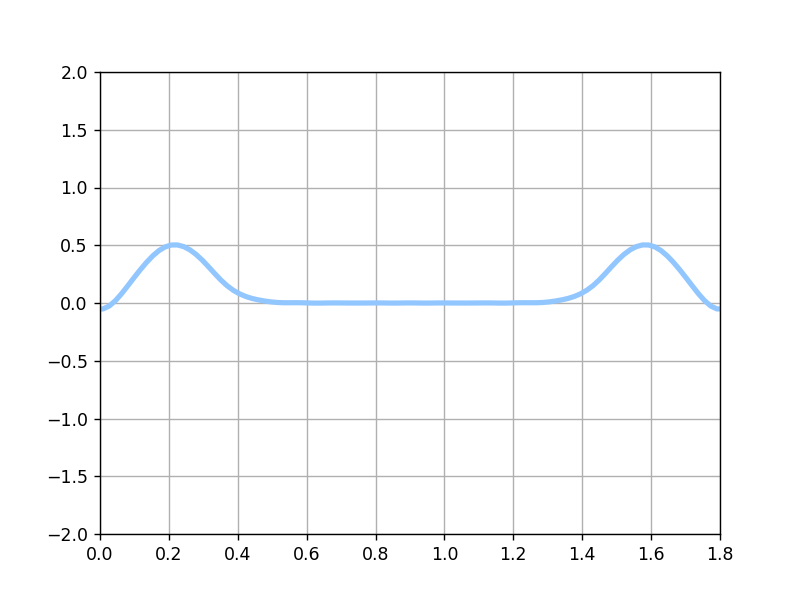

In [10]:
fig = plt.figure()
ax = plt.axes(xlim=(r_min, r_max), ylim=(-2, 2))
plt.grid()
line, = ax.plot([], [], lw=3)


def init():
    line.set_data([], [])
    return line,

def animate(i):
    global u1, f, u0
    x = [r(j) for j in range(count + 2)]
    y = gen_next(u1, f, u0)
    u1, u0 = y, u1
    line.set_data(x, y)
    return line,

anim = FuncAnimation(fig, animate, init_func=init,
                               frames=int(T/tau), interval=20, blit=True)
HTML(anim.to_jshtml())
